# Importing needed libraries

In [60]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Q1

### Part A

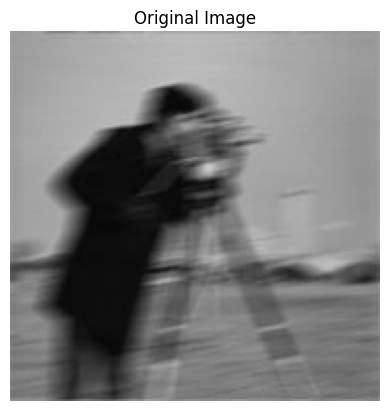

In [61]:
image1_1 = cv2.imread('Q1/1.1.jpg')

image1_1_rgb = cv2.cvtColor(image1_1, cv2.COLOR_BGR2RGB)

plt.imshow(image1_1_rgb)
plt.title('Original Image')
plt.axis('off')  
plt.show()

In [62]:
sharpening_kernel = np.array([[-1, -1, -1],
                              [-1,  9, -1],
                              [-1, -1, -1]])

filtered_image1 = cv2.filter2D(image1_1, -1, sharpening_kernel)

In [63]:
simple_sharpening_kernel = np.array([[ 0, -1,  0],
                              [-1,  5, -1],
                              [ 0, -1,  0]])


filtered_image2 = cv2.filter2D(image1_1, -1, simple_sharpening_kernel)

In [64]:
strong_sharpening_kernel = np.array([[ 1, -2,  1],
                                     [-2,  5, -2],
                                     [ 1, -2,  1]])

filtered_image3 = cv2.filter2D(image1_1, -1, strong_sharpening_kernel)


In [65]:
sobel_horizontal = np.array([[-1, -2, -1],
                             [ 0,  0,  0],
                             [ 1,  2,  1]])

sobel_vertical = np.array([[-1,  0,  1],
                           [-2,  0,  2],
                           [-1,  0,  1]])


filtered_image4 = cv2.filter2D(image1_1, -1, sobel_horizontal)
filtered_image4_2 = cv2.filter2D(filtered_image4, -1, sobel_horizontal)



In [66]:
laplacian_kernel = np.array([[ 1,  1,  1],
                                 [ 1, -8,  1],
                                 [ 1,  1,  1]])


filtered_image5 = cv2.filter2D(image1_1, -1, laplacian_kernel)

In [67]:
unsharp_masking_kernel = np.array([[-1, -1, -1, -1, -1],
                                   [-1,  2,  2,  2, -1],
                                   [-1,  2,  8,  2, -1],
                                   [-1,  2,  2,  2, -1],
                                   [-1, -1, -1, -1, -1]]) / 8.0

filtered_image6 = cv2.filter2D(image1_1, -1, unsharp_masking_kernel)


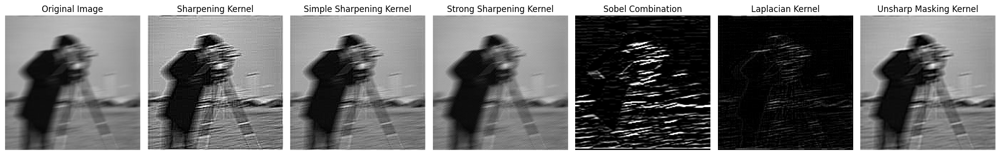

In [68]:
fig, ax = plt.subplots(1, 7, figsize=(20, 20))

ax[0].imshow(image1_1, cmap='gray')
ax[0].set_title('Original Image')
ax[0].axis('off')

ax[1].imshow(filtered_image1, cmap='gray')
ax[1].set_title('Sharpening Kernel')
ax[1].axis('off')

ax[2].imshow(filtered_image2, cmap='gray')
ax[2].set_title('Simple Sharpening Kernel')
ax[2].axis('off')

ax[3].imshow(filtered_image3, cmap='gray')
ax[3].set_title('Strong Sharpening Kernel')
ax[3].axis('off')

ax[4].imshow(filtered_image4_2, cmap='gray')
ax[4].set_title('Sobel Combination')
ax[4].axis('off')

ax[5].imshow(filtered_image5, cmap='gray')
ax[5].set_title('Laplacian Kernel')
ax[5].axis('off')

ax[6].imshow(filtered_image6, cmap='gray')
ax[6].set_title('Unsharp Masking Kernel')
ax[6].axis('off')

plt.tight_layout()

### Part B

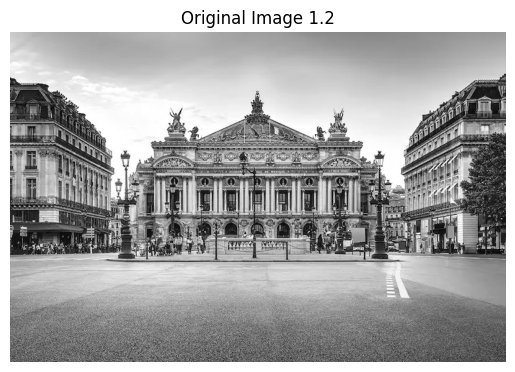

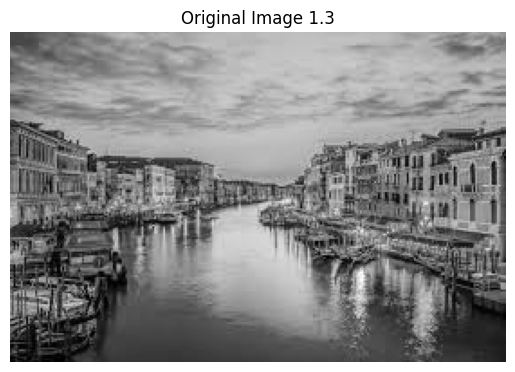

In [69]:
image1_2 = cv2.imread('Q1/1.2.jpg')
image1_2 = cv2.cvtColor(image1_2, cv2.COLOR_BGR2GRAY)

image1_3 = cv2.imread('Q1/1.3.jpg')
image1_3 = cv2.cvtColor(image1_3, cv2.COLOR_BGR2GRAY)

plt.imshow(image1_2, cmap='gray')
plt.title('Original Image 1.2')
plt.axis('off')  # Hide the axis
plt.show()

plt.imshow(image1_3, cmap='gray')
plt.title('Original Image 1.3')
plt.axis('off')  # Hide the axis
plt.show()

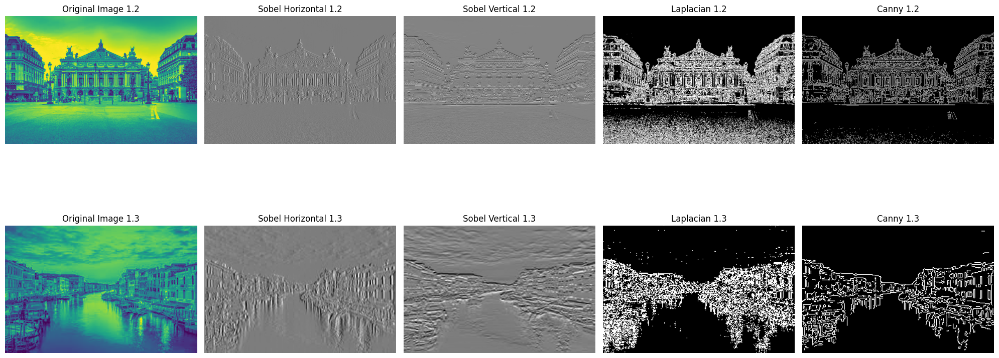

In [70]:
sobel_horizontal_image1_2 = cv2.Sobel(image1_2, cv2.CV_64F, 1, 0, ksize=3)
sobel_vertical_image1_2 = cv2.Sobel(image1_2, cv2.CV_64F, 0, 1, ksize=3)
sobel_horizontal_image1_3 = cv2.Sobel(image1_3, cv2.CV_64F, 1, 0, ksize=3)
sobel_vertical_image1_3 = cv2.Sobel(image1_3, cv2.CV_64F, 0, 1, ksize=3)


laplacian_image1_2 = cv2.Laplacian(image1_2, cv2.CV_64F)
laplacian_image1_3 = cv2.Laplacian(image1_3, cv2.CV_64F)

# Apply thresholding to make edges bolder
_, laplacian_image1_2_thresh = cv2.threshold(np.abs(laplacian_image1_2).astype(np.uint8), 50, 225, cv2.THRESH_BINARY)
_, laplacian_image1_3_thresh = cv2.threshold(np.abs(laplacian_image1_3).astype(np.uint8), 50, 225, cv2.THRESH_BINARY)

canny_image1_2 = cv2.Canny(image1_2, 230, 330)
canny_image1_3 = cv2.Canny(image1_3, 230, 330)

fig, axes = plt.subplots(2, 5, figsize=(20, 10))

axes[0, 0].imshow(image1_2)
axes[0, 0].set_title('Original Image 1.2')
axes[0, 0].axis('off')

axes[1, 0].imshow(image1_3)
axes[1, 0].set_title('Original Image 1.3')    
axes[1, 0].axis('off')

axes[0, 1].imshow(sobel_horizontal_image1_2, cmap='gray')
axes[0, 1].set_title('Sobel Horizontal 1.2')
axes[0, 1].axis('off')

axes[1, 1].imshow(sobel_horizontal_image1_3, cmap='gray')
axes[1, 1].set_title('Sobel Horizontal 1.3')
axes[1, 1].axis('off')

axes[0, 2].imshow(sobel_vertical_image1_2, cmap='gray')
axes[0, 2].set_title('Sobel Vertical 1.2')
axes[0, 2].axis('off')

axes[1, 2].imshow(sobel_vertical_image1_3, cmap='gray')
axes[1, 2].set_title('Sobel Vertical 1.3')
axes[1, 2].axis('off')

axes[0, 3].imshow(laplacian_image1_2_thresh, cmap='gray')
axes[0, 3].set_title('Laplacian 1.2')
axes[0, 3].axis('off')

axes[1, 3].imshow(laplacian_image1_3_thresh, cmap='gray')
axes[1, 3].set_title('Laplacian 1.3')
axes[1, 3].axis('off')

axes[0, 4].imshow(canny_image1_2, cmap='gray')
axes[0, 4].set_title('Canny 1.2')
axes[0, 4].axis('off')

axes[1, 4].imshow(canny_image1_3, cmap='gray')
axes[1, 4].set_title('Canny 1.3')
axes[1, 4].axis('off')

plt.tight_layout()
plt.show()


### Part c

In [71]:
image1_4 = cv2.imread('Q1/1.4.jpg')
image1_5 = cv2.imread('Q1/1.5.jpg')

In [72]:
def equalize_histogram_color(img):
    # Convert image to YUV color space
    img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    
    # Apply histogram equalization to the Y channel
    img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])
    
    # Convert back to BGR color space
    img_output = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)
    
    return img_output

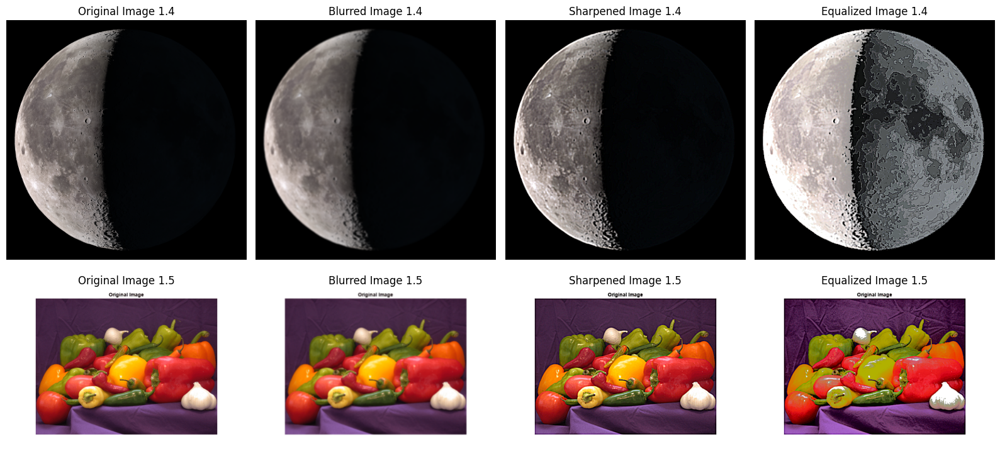

In [73]:
blurred_image1_4 = cv2.GaussianBlur(image1_4, (5, 5), 0)
blurred_image1_5 = cv2.GaussianBlur(image1_5, (5, 5), 0)

# Apply sharpening filter to enhance details
kernel_sharpening = np.array([[-1, -1, -1],
                               [-1, 9, -1],
                               [-1, -1, -1]])
sharpened_image1_4 = cv2.filter2D(blurred_image1_4, -1, kernel_sharpening)
sharpened_image1_5 = cv2.filter2D(blurred_image1_5, -1, kernel_sharpening)

# Increase contrast
alpha = 1.5  # Contrast control (1.0-3.0)
beta = 0     # Brightness control (0-100)
contrast_enhanced_image1_4 = cv2.convertScaleAbs(sharpened_image1_4, alpha=alpha, beta=beta)
contrast_enhanced_image1_5 = cv2.convertScaleAbs(sharpened_image1_5, alpha=alpha, beta=beta)

# Apply histogram equalization
equalized_image1_4 = equalize_histogram_color(contrast_enhanced_image1_4)
equalized_image1_5 = equalize_histogram_color(contrast_enhanced_image1_5)


# Display the original and enhanced images
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

axes[0, 0].imshow(cv2.cvtColor(image1_4, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Original Image 1.4')
axes[0, 0].axis('off')

axes[0, 1].imshow(cv2.cvtColor(blurred_image1_4, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title('Blurred Image 1.4')
axes[0, 1].axis('off')

axes[0, 2].imshow(cv2.cvtColor(sharpened_image1_4, cv2.COLOR_BGR2RGB))
axes[0, 2].set_title('Sharpened Image 1.4')
axes[0, 2].axis('off')

axes[0, 3].imshow(cv2.cvtColor(equalized_image1_4, cv2.COLOR_BGR2RGB))
axes[0, 3].set_title('Equalized Image 1.4')
axes[0, 3].axis('off')

axes[1, 0].imshow(cv2.cvtColor(image1_5, cv2.COLOR_BGR2RGB))
axes[1, 0].set_title('Original Image 1.5')
axes[1, 0].axis('off')

axes[1, 1].imshow(cv2.cvtColor(blurred_image1_5, cv2.COLOR_BGR2RGB))
axes[1, 1].set_title('Blurred Image 1.5')
axes[1, 1].axis('off')

axes[1, 2].imshow(cv2.cvtColor(sharpened_image1_5, cv2.COLOR_BGR2RGB))
axes[1, 2].set_title('Sharpened Image 1.5')
axes[1, 2].axis('off')

axes[1, 3].imshow(cv2.cvtColor(equalized_image1_5, cv2.COLOR_BGR2RGB))
axes[1, 3].set_title('Equalized Image 1.5')
axes[1, 3].axis('off')

plt.tight_layout()
plt.show()

### Part D

##### Otsu's thresholding

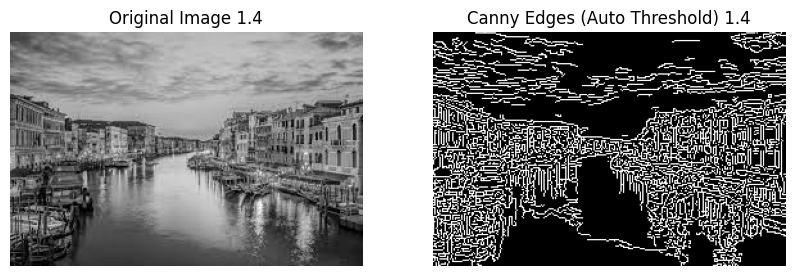

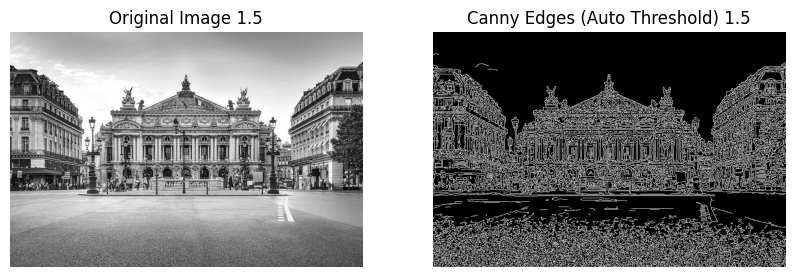

In [74]:
image1_3 = cv2.imread('Q1/1.3.jpg', cv2.IMREAD_GRAYSCALE)
image1_2 = cv2.imread('Q1/1.2.jpg', cv2.IMREAD_GRAYSCALE)

otsu_threshold1, _ = cv2.threshold(image1_3, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
otsu_threshold2, _ = cv2.threshold(image1_2, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Apply Canny edge detection with automatic thresholding
canny_edges1 = cv2.Canny(image1_3, otsu_threshold1 * 0.5, otsu_threshold1)
canny_edges2 = cv2.Canny(image1_2, otsu_threshold2 * 0.5, otsu_threshold2)

# Display the results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image1_3, cmap='gray')
plt.title('Original Image 1.4')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(canny_edges1, cmap='gray')
plt.title('Canny Edges (Auto Threshold) 1.4')
plt.axis('off')

plt.show()

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image1_2, cmap='gray')
plt.title('Original Image 1.5')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(canny_edges2, cmap='gray')
plt.title('Canny Edges (Auto Threshold) 1.5')
plt.axis('off')

plt.show()


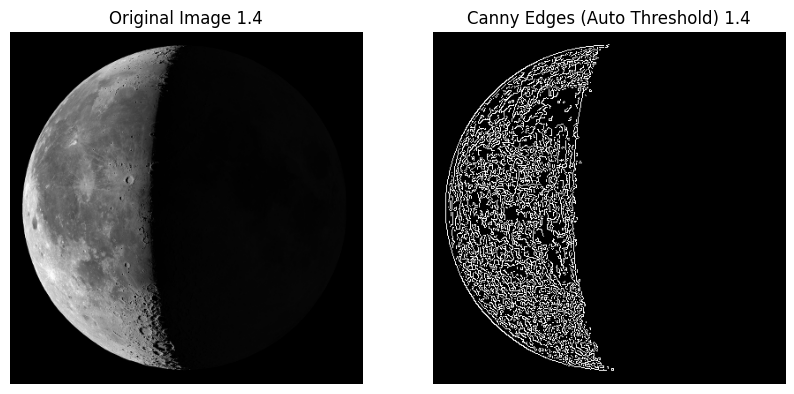

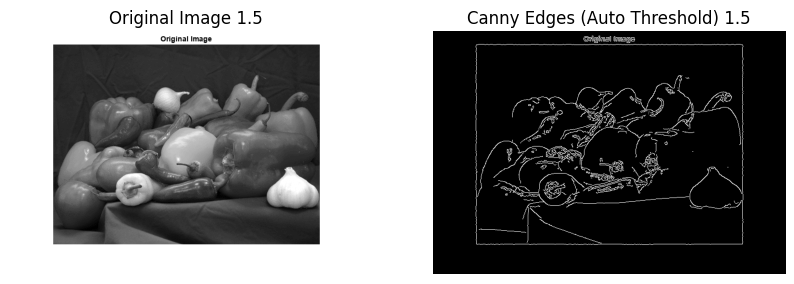

In [75]:
image1_4 = cv2.imread('Q1/1.4.jpg', cv2.IMREAD_GRAYSCALE)
image1_5 = cv2.imread('Q1/1.5.jpg', cv2.IMREAD_GRAYSCALE)

otsu_threshold1, _ = cv2.threshold(image1_4, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
otsu_threshold2, _ = cv2.threshold(image1_5, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Apply Canny edge detection with automatic thresholding
canny_edges1 = cv2.Canny(image1_4, otsu_threshold1 * 0.5, otsu_threshold1)
canny_edges2 = cv2.Canny(image1_5, otsu_threshold2 * 0.5, otsu_threshold2)

# Display the results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image1_4, cmap='gray')
plt.title('Original Image 1.4')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(canny_edges1, cmap='gray')
plt.title('Canny Edges (Auto Threshold) 1.4')
plt.axis('off')

plt.show()

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image1_5, cmap='gray')
plt.title('Original Image 1.5')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(canny_edges2, cmap='gray')
plt.title('Canny Edges (Auto Threshold) 1.5')
plt.axis('off')

plt.show()


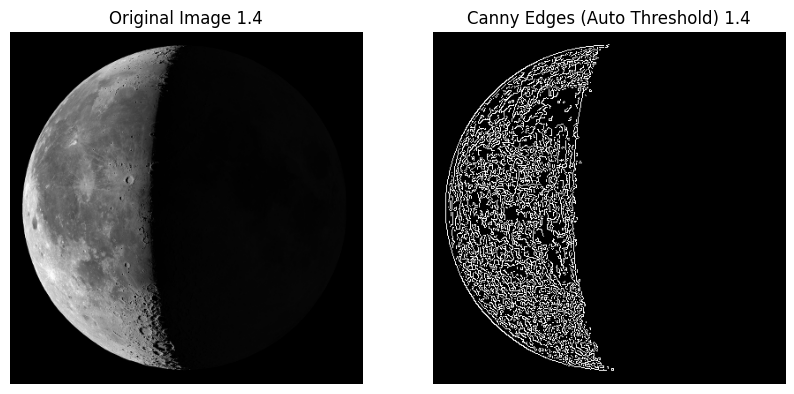

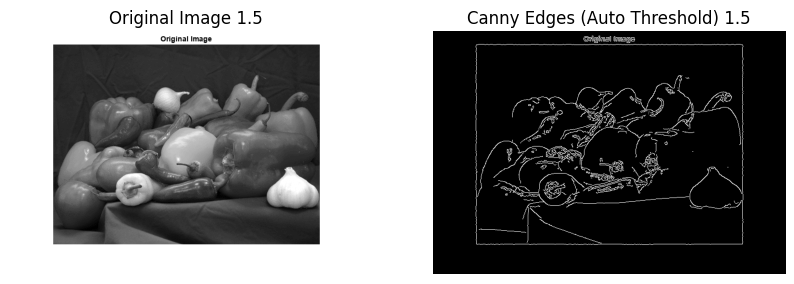

In [76]:
image1_4 = cv2.imread('Q1/1.4.jpg', cv2.IMREAD_GRAYSCALE)
image1_5 = cv2.imread('Q1/1.5.jpg', cv2.IMREAD_GRAYSCALE)

otsu_threshold1, _ = cv2.threshold(image1_4, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
otsu_threshold2, _ = cv2.threshold(image1_5, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Apply Canny edge detection with automatic thresholding
canny_edges1 = cv2.Canny(image1_4, otsu_threshold1 * 0.5, otsu_threshold1)
canny_edges2 = cv2.Canny(image1_5, otsu_threshold2 * 0.5, otsu_threshold2)

# Display the results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image1_4, cmap='gray')
plt.title('Original Image 1.4')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(canny_edges1, cmap='gray')
plt.title('Canny Edges (Auto Threshold) 1.4')
plt.axis('off')

plt.show()

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image1_5, cmap='gray')
plt.title('Original Image 1.5')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(canny_edges2, cmap='gray')
plt.title('Canny Edges (Auto Threshold) 1.5')
plt.axis('off')

plt.show()


# Q2

This is image {i}: <class 'numpy.ndarray'> with dimensions: (703, 928, 3)


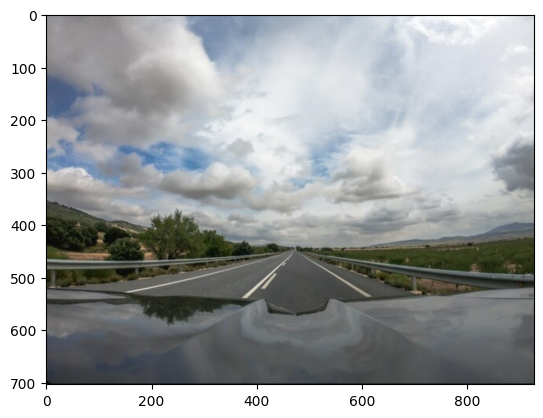

In [77]:
import matplotlib.image as mpimg


image = mpimg.imread('Q2/input1.jpg')
print('This is image {i}:', type(image), 'with dimensions:', image.shape)
plt.imshow(image)
plt.show()

In [78]:

region_of_interest_vertices = [
    (0, image.shape[0]),
    (image.shape[1] / 2, image.shape[0] / 2),
    (image.shape[1], image.shape[0]),
]

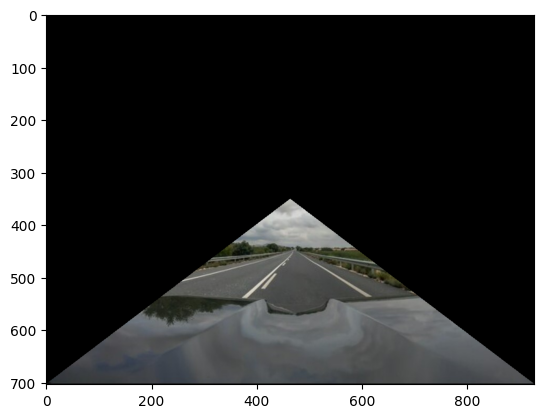

In [79]:
def region_of_interest(img, vertices):
    # Define a blank matrix that matches the image height/width.
    mask = np.zeros_like(img)
    # Retrieve the number of color channels of the image.
    channel_count = img.shape[2]
    # Create a match color with the same color channel counts.
    match_mask_color = (255,) * channel_count
      
    # Fill inside the polygon
    cv2.fillPoly(mask, vertices, match_mask_color)
    
    # Returning the image only where mask pixels match
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


cropped_image = region_of_interest(
    image,
    np.array([region_of_interest_vertices], np.int32),
)

plt.figure()
plt.imshow(cropped_image)
plt.show()

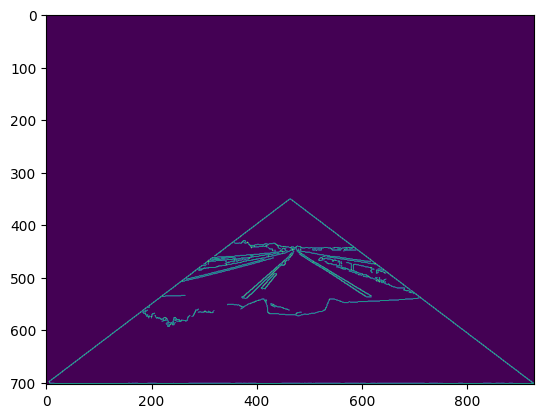

In [80]:
gray_image = cv2.cvtColor(cropped_image, cv2.COLOR_RGB2GRAY)
# Call Canny Edge Detection here.
cannyed_image = cv2.Canny(gray_image, 100, 200)
plt.figure()
plt.imshow(cannyed_image)
plt.show()

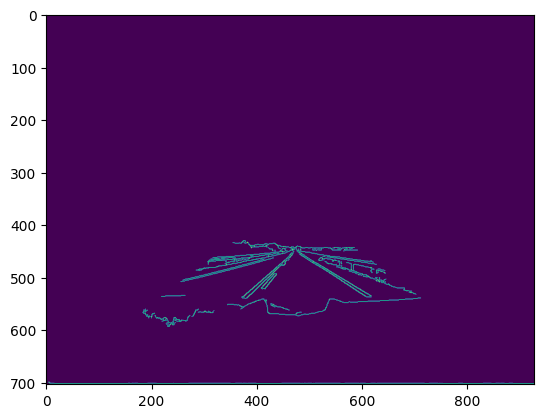

In [81]:
def region_of_interest(img, vertices):
    mask = np.zeros_like(img)
    match_mask_color = 255 
    
    cv2.fillPoly(mask, vertices, match_mask_color)
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
cannyed_image = cv2.Canny(gray_image, 100, 200)
cropped_image = region_of_interest(
    cannyed_image,
    np.array([region_of_interest_vertices], np.int32)
)
plt.figure()
plt.imshow(cropped_image)
plt.show()

In [82]:
gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
cannyed_image = cv2.Canny(gray_image, 200, 300)
cropped_image = region_of_interest(
    cannyed_image,
    np.array(
        [region_of_interest_vertices],
        np.int32
    ),
)
lines = cv2.HoughLinesP(
    cropped_image,
    rho=6,
    theta=np.pi / 60,
    threshold=160,
    lines=np.array([]),
    minLineLength=40,
    maxLineGap=25
)
print(lines)

[[[720 702 927 702]]

 [[448 701 753 701]]

 [[506 472 557 502]]

 [[307 470 403 460]]

 [[435 436 475 445]]

 [[297 499 373 479]]

 [[568 463 628 475]]

 [[568 511 613 537]]

 [[390 532 481 441]]

 [[296 499 344 484]]

 [[497 466 543 493]]

 [[549 460 619 474]]

 [[466 442 525 480]]

 [[483 442 570 446]]

 [[385 468 467 442]]

 [[373 539 453 467]]

 [[409 521 450 470]]

 [[572 507 618 537]]

 [[275 504 320 490]]]


In [83]:
def draw_lines(img, lines, color=[255, 0, 0], thickness=3):
    # If there are no lines to draw, exit.
    if lines is None:
        return
    # Make a copy of the original image.
    img = np.copy(img)
    # Create a blank image that matches the original in size.
    line_img = np.zeros(
        (
            img.shape[0],
            img.shape[1],
            3
        ),
        dtype=np.uint8,
    )
    # Loop over all lines and draw them on the blank image.
    for line in lines:
        for x1, y1, x2, y2 in line:
            cv2.line(line_img, (x1, y1), (x2, y2), color, thickness)
    # Merge the image with the lines onto the original.
    img = cv2.addWeighted(img, 0.8, line_img, 1.0, 0.0)  
    # Return the modified image.
    return img


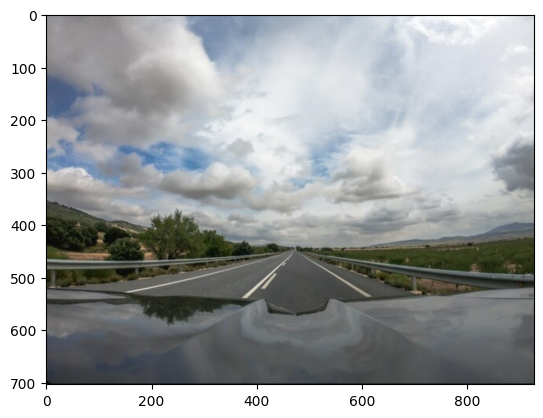

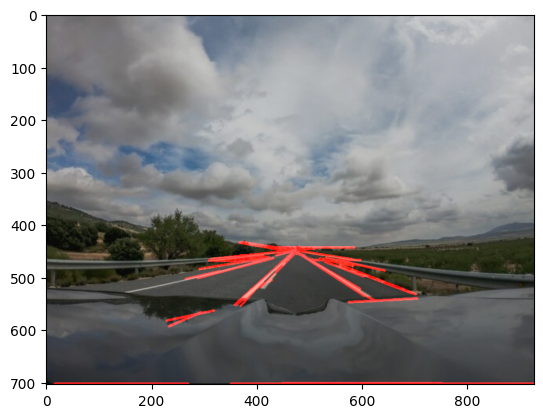

In [84]:
image = mpimg.imread('Q2/input1.jpg')
plt.figure()
plt.imshow(image)
plt.show()

gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

cannyed_image = cv2.Canny(gray_image, 100, 200)

cropped_image = region_of_interest(
    cannyed_image,
    np.array(
        [region_of_interest_vertices],
        np.int32
    ),
)
lines = cv2.HoughLinesP(
    cropped_image,
    rho=6,
    theta=np.pi / 60,
    threshold=160,
    lines=np.array([]),
    minLineLength=40,
    maxLineGap=25
)
line_image = draw_lines(image, lines) 
plt.figure()
plt.imshow(line_image)
plt.show()

This is image {i}: <class 'numpy.ndarray'> with dimensions: (540, 960, 3)


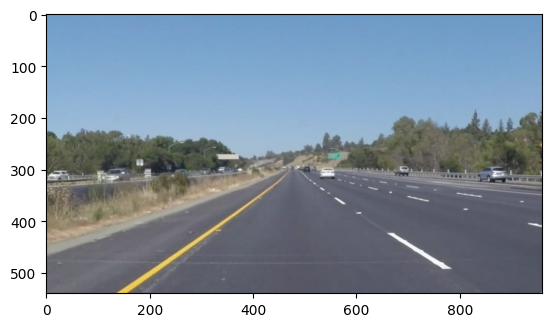

In [85]:
image = mpimg.imread('Q2/input2.jpg')
print('This is image {i}:', type(image), 'with dimensions:', image.shape)
plt.imshow(image)
plt.show()

In [86]:
region_of_interest_vertices = [
    (0, 540),
    (960/2 , 540 /3),
    (960, 540),
]

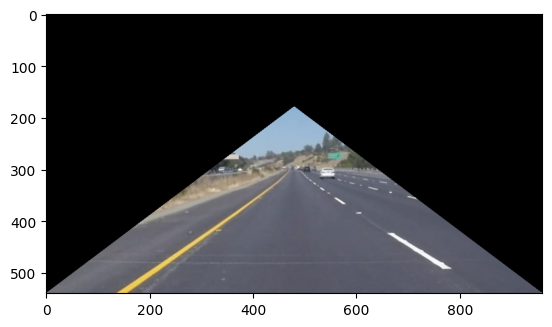

In [87]:
def region_of_interest(img, vertices):
    # Define a blank matrix that matches the image height/width.
    mask = np.zeros_like(img)
    # Retrieve the number of color channels of the image.
    channel_count = img.shape[2]
    # Create a match color with the same color channel counts.
    match_mask_color = (255,) * channel_count
      
    # Fill inside the polygon
    cv2.fillPoly(mask, vertices, match_mask_color)
    
    # Returning the image only where mask pixels match
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


cropped_image = region_of_interest(
    image,
    np.array([region_of_interest_vertices], np.int32),
)

plt.figure()
plt.imshow(cropped_image)
plt.show()

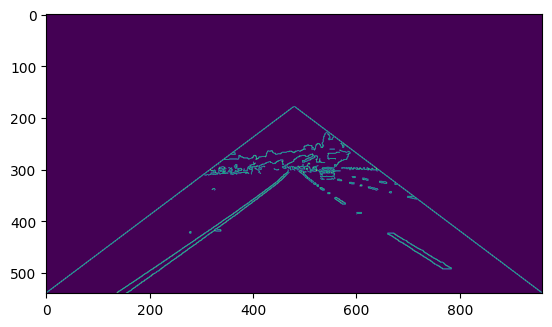

In [88]:
gray_image = cv2.cvtColor(cropped_image, cv2.COLOR_RGB2GRAY)
# Call Canny Edge Detection here.
cannyed_image = cv2.Canny(gray_image, 100, 200)
plt.figure()
plt.imshow(cannyed_image)
plt.show()

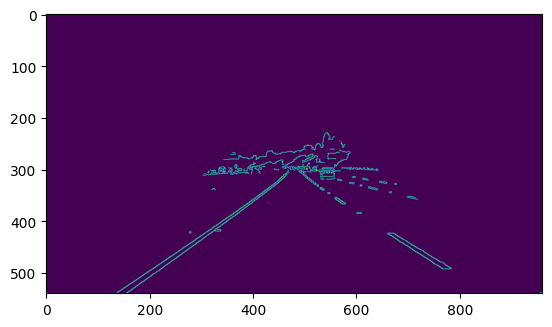

In [89]:
def region_of_interest(img, vertices):
    mask = np.zeros_like(img)
    match_mask_color = 255 
    
    cv2.fillPoly(mask, vertices, match_mask_color)
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
cannyed_image = cv2.Canny(gray_image, 100, 200)
# Moved the cropping operation to the end of the pipeline.
cropped_image = region_of_interest(
    cannyed_image,
    np.array([region_of_interest_vertices], np.int32)
)
plt.figure()
plt.imshow(cropped_image)
plt.show()

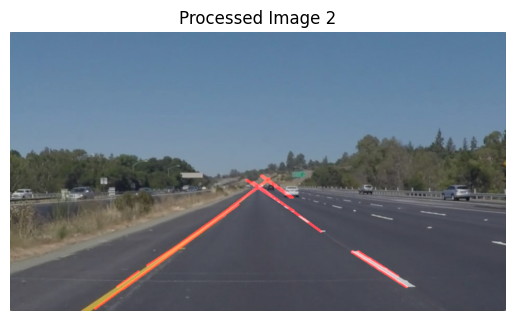

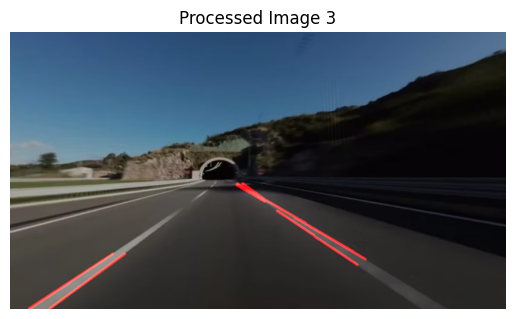

In [90]:
def process_image(image_path):
    image = mpimg.imread(image_path)
    
    # Define region of interest vertices
    region_of_interest_vertices = [
        (0, image.shape[0]),
        (image.shape[1] / 2, image.shape[0] / 2),
        (image.shape[1], image.shape[0]),
    ]
    
    # Define a function for region of interest masking
    def region_of_interest(img, vertices):
        mask = np.zeros_like(img)
        match_mask_color = 255
        
        cv2.fillPoly(mask, vertices, match_mask_color)
        masked_image = cv2.bitwise_and(img, mask)
        return masked_image
    
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Apply Canny edge detection
    cannyed_image = cv2.Canny(gray_image, 100, 200)
    
    # Apply region of interest masking
    cropped_image = region_of_interest(
        cannyed_image,
        np.array([region_of_interest_vertices], np.int32)
    )
    
    # Detect lines using Hough transform
    lines = cv2.HoughLinesP(
        cropped_image,
        rho=6,
        theta=np.pi / 60,
        threshold=160,
        lines=np.array([]),
        minLineLength=40,
        maxLineGap=25
    )
    
    # Define a function for drawing lines
    def draw_lines(img, lines, color=[255, 0, 0], thickness=3):
        if lines is None:
            return img
        
        line_img = np.zeros_like(img)
        for line in lines:
            for x1, y1, x2, y2 in line:
                cv2.line(line_img, (x1, y1), (x2, y2), color, thickness)
        
        img = cv2.addWeighted(img, 0.8, line_img, 1.0, 0.0)
        return img
    
    # Draw lines on the original image
    image_with_lines = draw_lines(image, lines)
    
    return image_with_lines




for i in range(1, 7):
    if i == 2 or i == 3: 
        image_path = f'Q2/input{i}.jpg'
        processed_image = process_image(image_path)
        plt.figure()
        plt.imshow(processed_image)
        plt.title(f"Processed Image {i}")
        plt.axis('off')
        plt.show()


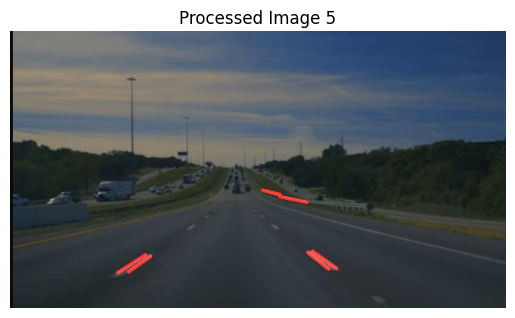

In [91]:
def process_image(image_path):
    # Load the image
    image = mpimg.imread(image_path)
    
    # Define region of interest vertices
    region_of_interest_vertices = [
        (0, image.shape[0]),
        (image.shape[1] / 2, image.shape[0] / 2),
        (image.shape[1], image.shape[0]),
    ]
    
    # Define a function for region of interest masking
    def region_of_interest(img, vertices):
        mask = np.zeros_like(img)
        match_mask_color = 255
        
        cv2.fillPoly(mask, vertices, match_mask_color)
        masked_image = cv2.bitwise_and(img, mask)
        return masked_image
    
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Apply Canny edge detection
    cannyed_image = cv2.Canny(gray_image, 100, 200)
    
    # Apply region of interest masking
    cropped_image = region_of_interest(
        cannyed_image,
        np.array([region_of_interest_vertices], np.int32)
    )
    
    # Detect lines using Hough transform
    lines = cv2.HoughLinesP(
        cropped_image,
        rho=6,
        theta=np.pi / 60,
        threshold=100,  
        lines=np.array([]),
        minLineLength=20,  
        maxLineGap=10  
    )
    
    # Define a function for drawing lines
    def draw_lines(img, lines, color=[255, 0, 0], thickness=3):
        if lines is None:
            return img
        
        line_img = np.zeros_like(img)
        for line in lines:
            for x1, y1, x2, y2 in line:
                cv2.line(line_img, (x1, y1), (x2, y2), color, thickness)
        
        img = cv2.addWeighted(img, 0.8, line_img, 1.0, 0.0)
        return img
    
    # Draw lines on the original image
    image_with_lines = draw_lines(image, lines)
    
    return image_with_lines





image_path = f'Q2/input5.jpg'
processed_image = process_image(image_path)
plt.figure()
plt.imshow(processed_image)
plt.title(f"Processed Image 5")
plt.axis('off')
plt.show()


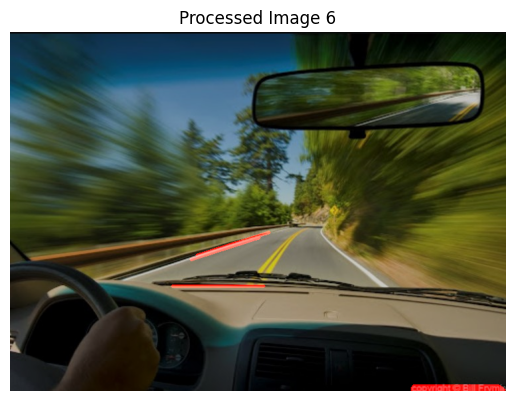

In [92]:
def process_image(image_path):
    image = mpimg.imread(image_path)
    
    # Define region of interest vertices
    region_of_interest_vertices = [
        (0, image.shape[0]),
        (image.shape[1] / 2, image.shape[0] / 2),
        (image.shape[1], image.shape[0]),
    ]
    
    # Define a function for region of interest masking
    def region_of_interest(img, vertices):
        mask = np.zeros_like(img)
        match_mask_color = 255
        
        cv2.fillPoly(mask, vertices, match_mask_color)
        masked_image = cv2.bitwise_and(img, mask)
        return masked_image
    
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Apply Canny edge detection
    cannyed_image = cv2.Canny(gray_image, 100, 200)
    
    # Apply region of interest masking
    cropped_image = region_of_interest(
        cannyed_image,
        np.array([region_of_interest_vertices], np.int32)
    )
    
    # Detect lines using Hough transform
    lines = cv2.HoughLinesP(
        cropped_image,
        rho=1,  # Decrease rho for finer resolution
        theta=np.pi / 180,  # Use a smaller theta for more precision
        threshold=50,  # Increase this value to detect fewer lines
        minLineLength=100,  # Increase this value to filter out shorter lines
        maxLineGap=10  # Increase this value to allow larger gaps between line segments
    )

    
    def draw_lines(img, lines, color=[255, 0, 0], thickness=3):
        if lines is None:
            return img
        
        line_img = np.zeros_like(img)
        for line in lines:
            for x1, y1, x2, y2 in line:
                cv2.line(line_img, (x1, y1), (x2, y2), color, thickness)
        
        img = cv2.addWeighted(img, 0.8, line_img, 1.0, 0.0)
        return img
    
    image_with_lines = draw_lines(image, lines)
    
    return image_with_lines





image_path = f'Q2/input6.jpg'
processed_image = process_image(image_path)
plt.figure()
plt.imshow(processed_image)
plt.title(f"Processed Image 6")
plt.axis('off')
plt.show()


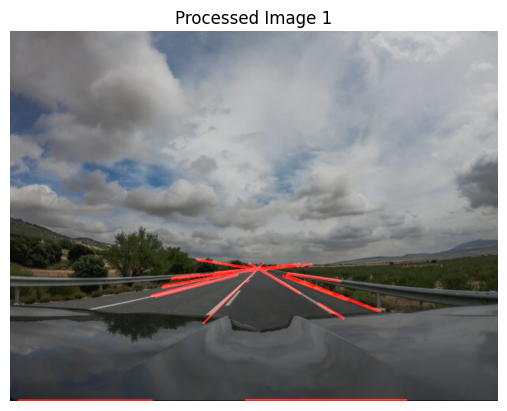

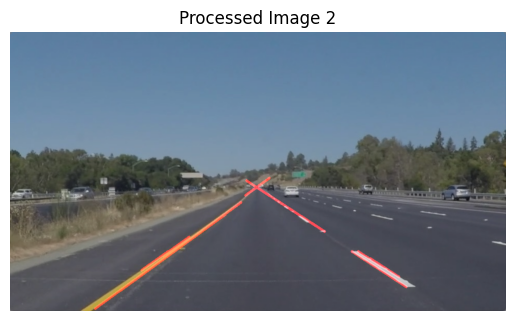

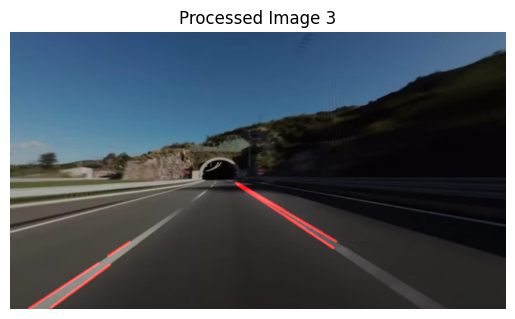

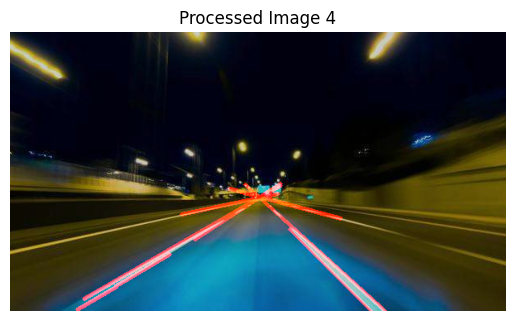

In [93]:
def process_image(image_path):
    image = mpimg.imread(image_path)
    
    # Define region of interest vertices
    region_of_interest_vertices = [
        (0, image.shape[0]),
        (image.shape[1] / 2, image.shape[0] / 2),
        (image.shape[1], image.shape[0]),
    ]
    
    # Define a function for region of interest masking
    def region_of_interest(img, vertices):
        mask = np.zeros_like(img)
        match_mask_color = 255
        
        cv2.fillPoly(mask, vertices, match_mask_color)
        masked_image = cv2.bitwise_and(img, mask)
        return masked_image
    
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Apply Canny edge detection
    cannyed_image = cv2.Canny(gray_image, 100, 200)
    
    # Apply region of interest masking
    cropped_image = region_of_interest(
        cannyed_image,
        np.array([region_of_interest_vertices], np.int32)
    )
    
    # Detect lines using Hough transform
    lines = cv2.HoughLinesP(
        cropped_image,
        rho=6,
        theta=np.pi / 60,
        threshold=250,
        lines=np.array([]),
        minLineLength=40,
        maxLineGap=25
    )
    
    # Define a function for drawing lines
    def draw_lines(img, lines, color=[255, 0, 0], thickness=3):
        if lines is None:
            return img
        
        line_img = np.zeros_like(img)
        for line in lines:
            for x1, y1, x2, y2 in line:
                cv2.line(line_img, (x1, y1), (x2, y2), color, thickness)
        
        img = cv2.addWeighted(img, 0.8, line_img, 1.0, 0.0)
        return img
    
    # Draw lines on the original image
    image_with_lines = draw_lines(image, lines)
    
    return image_with_lines




for i in range(1, 7):
    if i != 5 and i != 6: 
        image_path = f'Q2/input{i}.jpg'
        processed_image = process_image(image_path)
        plt.figure()
        plt.imshow(processed_image)
        plt.title(f"Processed Image {i}")
        plt.axis('off')
        plt.show()


# Q3

In [94]:
original_image = cv2.imread('Q3/3.0.png')  
cropped_image1 = cv2.imread('Q3/3.1.png')
cropped_image2 = cv2.imread('Q3/3.2.png')
cropped_image3 = cv2.imread('Q3/3.3.png')
cropped_image4 = cv2.imread('Q3/3.4.png')
cropped_image5 = cv2.imread('Q3/3.5.png')
cropped_image6 = cv2.imread('Q3/3.6.png')
cropped_image7 = cv2.imread('Q3/3.7.png')
cropped_image8 = cv2.imread('Q3/3.8.png')


gray_original = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
gray_template1 = cv2.cvtColor(cropped_image1, cv2.COLOR_BGR2GRAY)
gray_template2 = cv2.cvtColor(cropped_image2, cv2.COLOR_BGR2GRAY)
gray_template3 = cv2.cvtColor(cropped_image3, cv2.COLOR_BGR2GRAY)
gray_template4 = cv2.cvtColor(cropped_image4, cv2.COLOR_BGR2GRAY)
gray_template5 = cv2.cvtColor(cropped_image5, cv2.COLOR_BGR2GRAY)
gray_template6 = cv2.cvtColor(cropped_image6, cv2.COLOR_BGR2GRAY)
gray_template7 = cv2.cvtColor(cropped_image7, cv2.COLOR_BGR2GRAY)
gray_template8 = cv2.cvtColor(cropped_image8, cv2.COLOR_BGR2GRAY)


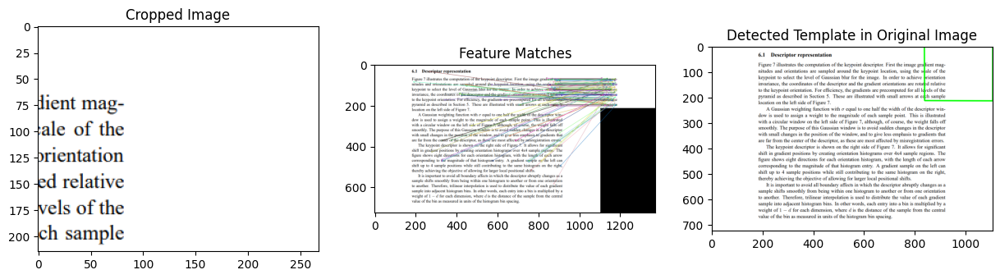

In [95]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detect_and_draw(original_image, cropped_image):
    gray_original = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
    gray_cropped = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)
    
    # Initialize SIFT detector
    sift = cv2.SIFT_create()
    
    # Detect keypoints and descriptors
    kp1, des1 = sift.detectAndCompute(gray_original, None)
    kp2, des2 = sift.detectAndCompute(gray_cropped, None)
    
    # Match descriptors using BFMatcher
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(des1, des2)
    
    # Sort matches based on distance
    matches = sorted(matches, key=lambda x: x.distance)
    
    # Draw matches
    img_matches = cv2.drawMatches(original_image, kp1, cropped_image, kp2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    
    # Extract location of good matches
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 2)
    
    # Find homography
    H, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)
    
    # Get dimensions of the cropped image
    h, w = gray_cropped.shape
    pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
    
    # Apply perspective transformation
    dst = cv2.perspectiveTransform(pts, H)
    
    # Draw bounding box in the original image
    original_image_with_box = cv2.polylines(original_image.copy(), [np.int32(dst)], True, (0, 255, 0), 3, cv2.LINE_AA)
    
    plt.figure(figsize=(15, 10))
    plt.subplot(131)
    plt.title('Cropped Image')
    plt.imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))
    
    plt.subplot(132)
    plt.title('Feature Matches')
    plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
    
    plt.subplot(133)
    plt.title('Detected Template in Original Image')
    plt.imshow(cv2.cvtColor(original_image_with_box, cv2.COLOR_BGR2RGB))
    plt.show()


detect_and_draw(original_image, cropped_image1)


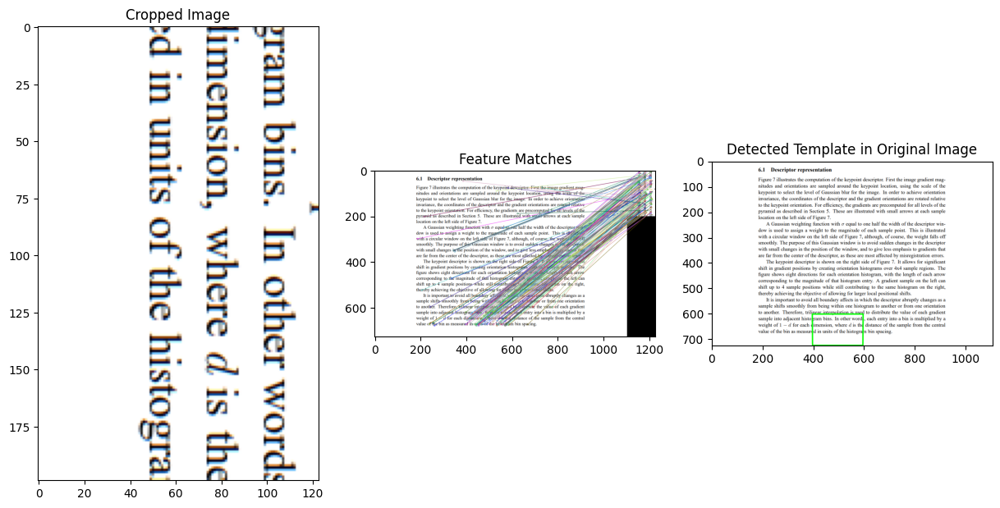

In [96]:
detect_and_draw(original_image, cropped_image2)


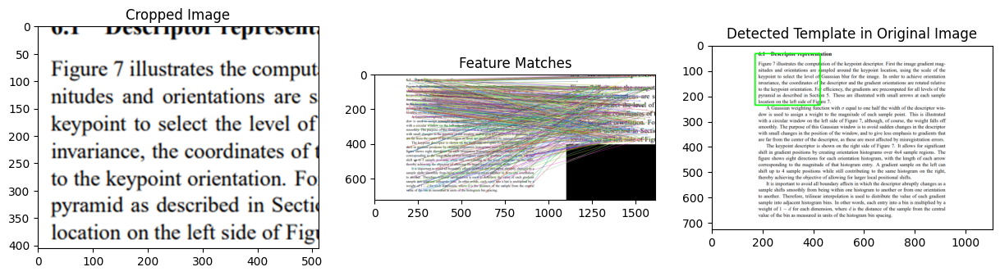

In [97]:
detect_and_draw(original_image, cropped_image4)


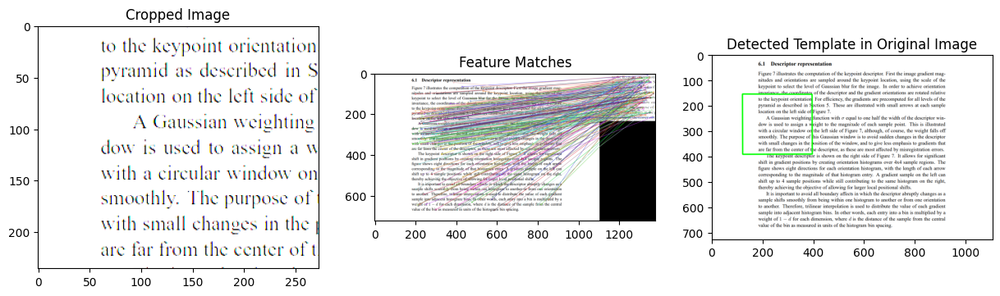

In [98]:
detect_and_draw(original_image, cropped_image5)


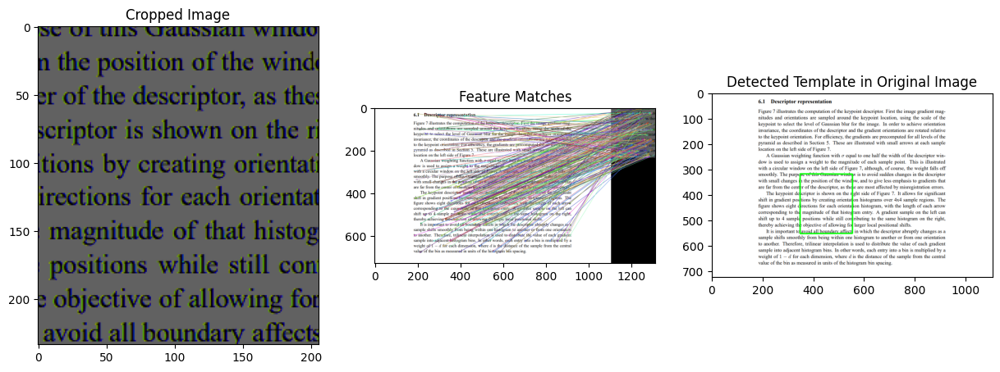

In [99]:
detect_and_draw(original_image, cropped_image6)


Number of good matches found: 51


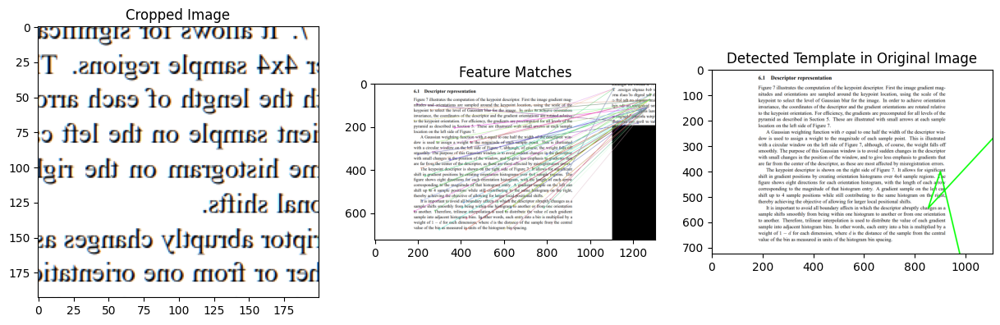

In [100]:
def detect_and_draw(original_image, cropped_image):
    gray_original = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
    gray_cropped = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)
    
    # Initialize SIFT detector
    sift = cv2.SIFT_create()
    
    # Detect keypoints and descriptors
    kp1, des1 = sift.detectAndCompute(gray_original, None)
    kp2, des2 = sift.detectAndCompute(gray_cropped, None)
    
    # FLANN parameters
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50) 
    
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    
    # Match descriptors using FLANN-based matcher
    matches = flann.knnMatch(des1, des2, k=2)
    
    # Apply Lowe's ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < 0.5 * n.distance:
            good_matches.append(m)
    
    print(f"Number of good matches found: {len(good_matches)}")
    
    if len(good_matches) > 4:  # Minimum number of matches required to find homography
        # Extract location of good matches
        src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 2)
        
        # Find homography
        H, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)
        
        if H is not None:
            # Get dimensions of the cropped image
            h, w = gray_cropped.shape
            pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
            
            # Apply perspective transformation
            dst = cv2.perspectiveTransform(pts, H)
            
            # Draw bounding box in the original image
            original_image_with_box = cv2.polylines(original_image.copy(), [np.int32(dst)], True, (0, 255, 0), 3, cv2.LINE_AA)
            
            plt.figure(figsize=(15, 10))
            plt.subplot(131)
            plt.title('Cropped Image')
            plt.imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))
            
            plt.subplot(132)
            plt.title('Feature Matches')
            img_matches = cv2.drawMatches(original_image, kp1, cropped_image, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
            plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
            
            plt.subplot(133)
            plt.title('Detected Template in Original Image')
            plt.imshow(cv2.cvtColor(original_image_with_box, cv2.COLOR_BGR2RGB))
            plt.show()
        else:
            print("Homography could not be computed.")
    else:
        print("Not enough good matches found.")


detect_and_draw(original_image, cropped_image3)




Number of good matches found: 814


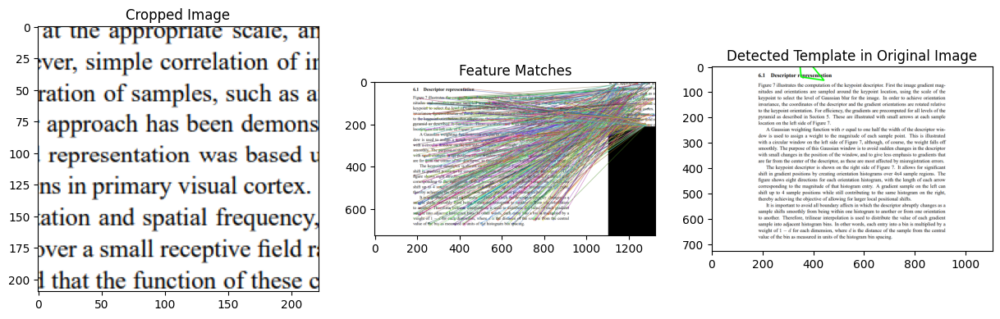

In [101]:
detect_and_draw(original_image, cropped_image8)


Number of good matches found: 88


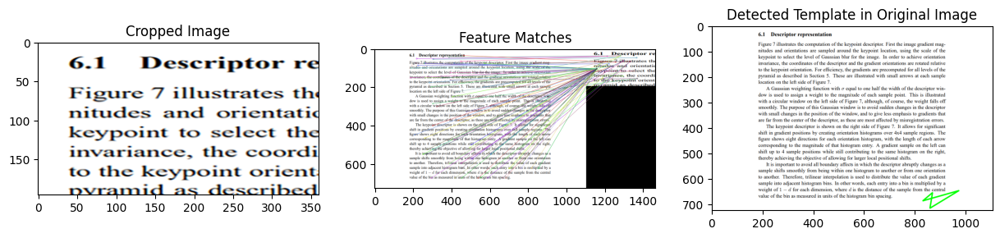

In [102]:
def detect_and_draw(original_image, cropped_image):
    gray_original = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
    gray_cropped = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)
    
    # Initialize SIFT detector
    sift = cv2.SIFT_create()
    
    # Detect keypoints and descriptors
    kp1, des1 = sift.detectAndCompute(gray_original, None)
    kp2, des2 = sift.detectAndCompute(gray_cropped, None)
    
    # FLANN parameters
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)  
    
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    
    # Match descriptors using FLANN-based matcher
    matches = flann.knnMatch(des1, des2, k=2)
    
    # Apply Lowe's ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good_matches.append(m)
    
    print(f"Number of good matches found: {len(good_matches)}")
    
    if len(good_matches) > 4:  # Minimum number of matches required to find homography
        src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 2)
        
        # Find homography
        H, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)
        
        if H is not None:
            # Get dimensions of the cropped image
            h, w = gray_cropped.shape
            pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
            
            # Apply perspective transformation
            dst = cv2.perspectiveTransform(pts, H)
            
            # Draw bounding box in the original image
            original_image_with_box = cv2.polylines(original_image.copy(), [np.int32(dst)], True, (0, 255, 0), 3, cv2.LINE_AA)
            
            plt.figure(figsize=(15, 10))
            plt.subplot(131)
            plt.title('Cropped Image')
            plt.imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))
            
            plt.subplot(132)
            plt.title('Feature Matches')
            img_matches = cv2.drawMatches(original_image, kp1, cropped_image, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
            plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
            
            plt.subplot(133)
            plt.title('Detected Template in Original Image')
            plt.imshow(cv2.cvtColor(original_image_with_box, cv2.COLOR_BGR2RGB))
            plt.show()
        else:
            print("Homography could not be computed.")
    else:
        print("Not enough good matches found.")

detect_and_draw(original_image, cropped_image7)

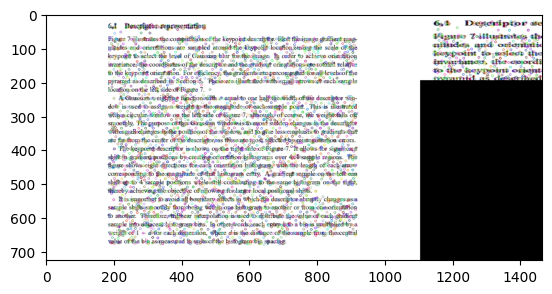

(<matplotlib.image.AxesImage at 0x14119f58100>, None)

In [103]:

img1 = cv2.imread('Q3/3.0.png')  
img2 = cv2.imread('Q3/3.7.png')



# Initiate SIFT detector
sift = cv2.SIFT_create()

# detect and compute the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)

# create BFMatcher object
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

# Apply ratio test
good = []
for m,n in matches:
   if m.distance < 0.1*n.distance:
      good.append([m])

# cv2.drawMatchesKnn expects a list of lists as matches.
img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,None,flags=0)
plt.imshow(img3),plt.show()

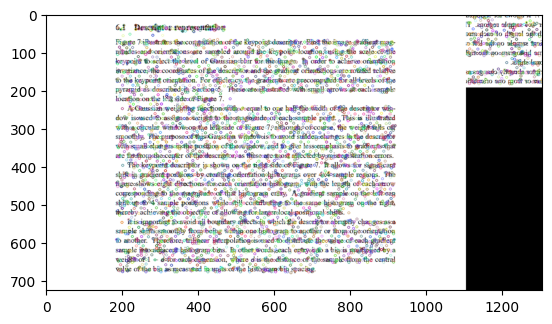

(<matplotlib.image.AxesImage at 0x1411a428130>, None)

In [104]:
img1 = cv2.imread('Q3/3.0.png')  
img2 = cv2.imread('Q3/3.3.png')



# Initiate SIFT detector
sift = cv2.SIFT_create()

# detect and compute the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)

# create BFMatcher object
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

# Apply ratio test
good = []
for m,n in matches:
   if m.distance < 0.1*n.distance:
      good.append([m])

# cv2.drawMatchesKnn expects a list of lists as matches.
img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,None,flags=0)
plt.imshow(img3),plt.show()

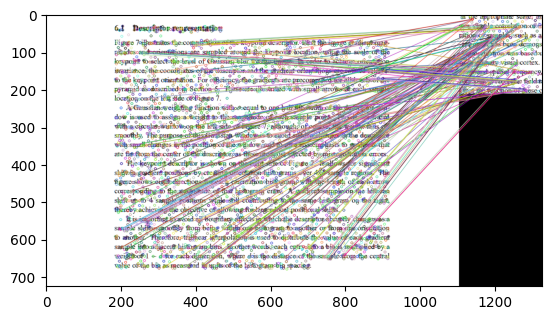

(<matplotlib.image.AxesImage at 0x1411859d550>, None)

In [105]:
img1 = cv2.imread('Q3/3.0.png')  
img2 = cv2.imread('Q3/3.8.png')



# Initiate SIFT detector
sift = cv2.SIFT_create()

# detect and compute the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)

# create BFMatcher object
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

# Apply ratio test
good = []
for m,n in matches:
   if m.distance < 0.1*n.distance:
      good.append([m])

# cv2.drawMatchesKnn expects a list of lists as matches.
img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,None,flags=0)
plt.imshow(img3),plt.show()

##### HOG

Best match found at location: (832, 0) with score: 166.79745483398438


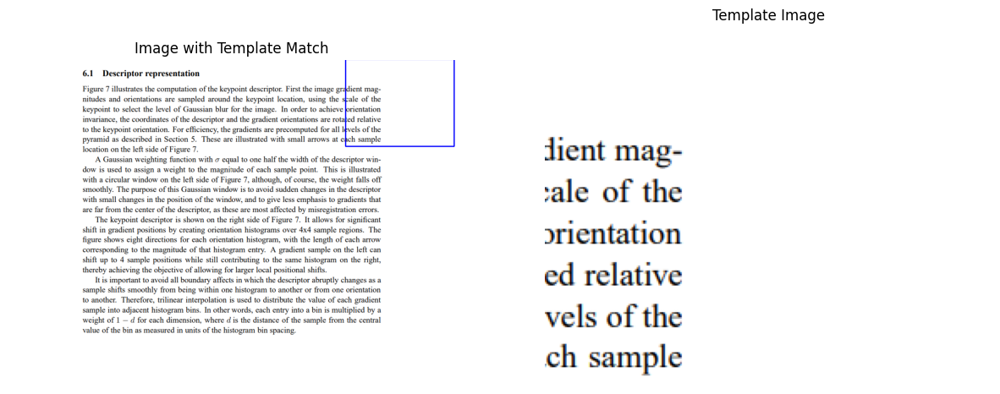

In [106]:
def hog_template_matching(target_image, template_image, threshold=0.5, pixels_per_cell=(8, 8), cells_per_block=(2, 2), step_size=8):
    if target_image is None or template_image is None:
        print("Error: Target image or template image is None.")
        return

    def compute_hog(image):
        hog = cv2.HOGDescriptor(_winSize=(image.shape[1] // pixels_per_cell[1] * pixels_per_cell[1],
                                           image.shape[0] // pixels_per_cell[0] * pixels_per_cell[0]),
                                _blockSize=(cells_per_block[1] * pixels_per_cell[1],
                                            cells_per_block[0] * pixels_per_cell[0]),
                                _blockStride=(pixels_per_cell[1], pixels_per_cell[0]),
                                _cellSize=(pixels_per_cell[1], pixels_per_cell[0]),
                                _nbins=9)
        return hog.compute(image).reshape(-1)

    target_gray = cv2.cvtColor(target_image, cv2.COLOR_BGR2GRAY)
    template_gray = cv2.cvtColor(template_image, cv2.COLOR_BGR2GRAY)
    template_hog = compute_hog(template_gray)
    template_height, template_width = template_gray.shape

    image_height, image_width = target_gray.shape
    best_score = -np.inf
    best_location = None

    for y in range(0, image_height - template_height + 1, step_size):
        for x in range(0, image_width - template_width + 1, step_size):
            window = target_gray[y:y + template_height, x:x + template_width]
            window_hog = compute_hog(window)
            score = np.dot(window_hog, template_hog)
            if score > best_score:
                best_score = score
                best_location = (x, y)

    if best_location is not None and best_score >= threshold:
        print(f"Best match found at location: {best_location} with score: {best_score}")
        top_left = best_location
        bottom_right = (top_left[0] + template_width, top_left[1] + template_height)
        cv2.rectangle(target_image, top_left, bottom_right, (255, 0, 0), 2)
        plt.figure(figsize=(15, 10))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(target_image, cv2.COLOR_BGR2RGB))
        plt.title('Image with Template Match')
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(template_image, cv2.COLOR_BGR2RGB))
        plt.title('Template Image')
        plt.axis('off')
        plt.show()
    else:
        print("No match found or score is below the threshold")

original_image = cv2.imread('Q3/3.0.png')  
cropped_image1 = cv2.imread('Q3/3.1.png')
gray_original = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
gray_template1 = cv2.cvtColor(cropped_image1, cv2.COLOR_BGR2GRAY)

hog_template_matching(original_image, cropped_image1, threshold=0.6)



Best match found at location: (832, 0) with score: 166.79745483398438


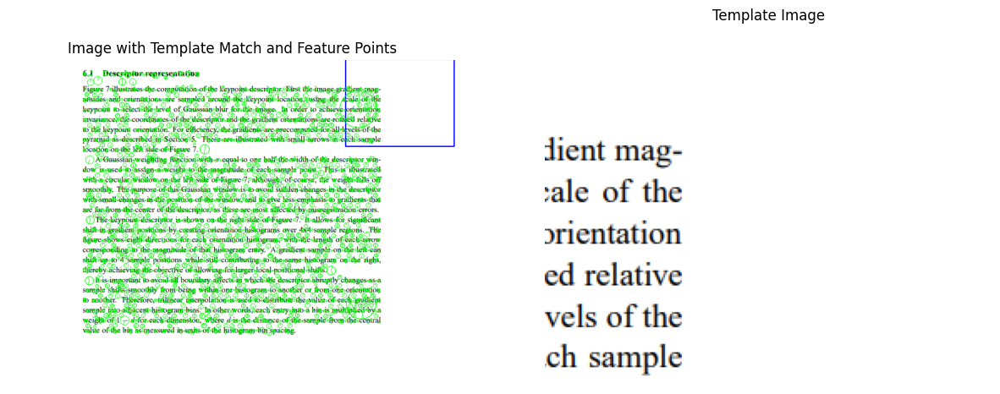

In [116]:
def hog_template_matching(target_image, template_image, threshold=0.5, pixels_per_cell=(8, 8), cells_per_block=(2, 2), step_size=8):
    if target_image is None or template_image is None:
        print("Error: Target image or template image is None.")
        return

    def compute_hog(image):
        hog = cv2.HOGDescriptor(_winSize=(image.shape[1] // pixels_per_cell[1] * pixels_per_cell[1],
                                           image.shape[0] // pixels_per_cell[0] * pixels_per_cell[0]),
                                _blockSize=(cells_per_block[1] * pixels_per_cell[1],
                                            cells_per_block[0] * pixels_per_cell[0]),
                                _blockStride=(pixels_per_cell[1], pixels_per_cell[0]),
                                _cellSize=(pixels_per_cell[1], pixels_per_cell[0]),
                                _nbins=9)
        return hog.compute(image).reshape(-1)

    target_gray = cv2.cvtColor(target_image, cv2.COLOR_BGR2GRAY)
    template_gray = cv2.cvtColor(template_image, cv2.COLOR_BGR2GRAY)
    template_hog = compute_hog(template_gray)
    template_height, template_width = template_gray.shape

    image_height, image_width = target_gray.shape
    best_score = -np.inf
    best_location = None

    for y in range(0, image_height - template_height + 1, step_size):
        for x in range(0, image_width - template_width + 1, step_size):
            window = target_gray[y:y + template_height, x:x + template_width]
            window_hog = compute_hog(window)
            score = np.dot(window_hog, template_hog)
            if score > best_score:
                best_score = score
                best_location = (x, y)

    if best_location is not None and best_score >= threshold:
        print(f"Best match found at location: {best_location} with score: {best_score}")
        top_left = best_location
        bottom_right = (top_left[0] + template_width, top_left[1] + template_height)
        cv2.rectangle(target_image, top_left, bottom_right, (255, 0, 0), 2)

        # Draw circles at feature points
        sift = cv2.SIFT_create()
        kp, _ = sift.detectAndCompute(gray_original, None)
        target_image_with_keypoints = cv2.drawKeypoints(target_image, kp, None, color=(0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

        plt.figure(figsize=(15, 10))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(target_image_with_keypoints, cv2.COLOR_BGR2RGB))
        plt.title('Image with Template Match and Feature Points')
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(template_image, cv2.COLOR_BGR2RGB))
        plt.title('Template Image')
        plt.axis('off')
        plt.show()
    else:
        print("No match found or score is below the threshold")

original_image = cv2.imread('Q3/3.0.png')  
cropped_image1 = cv2.imread('Q3/3.1.png')

hog_template_matching(original_image, cropped_image1, threshold=0.6)


Best match found at location: (536, 472) with score: 135.70953369140625


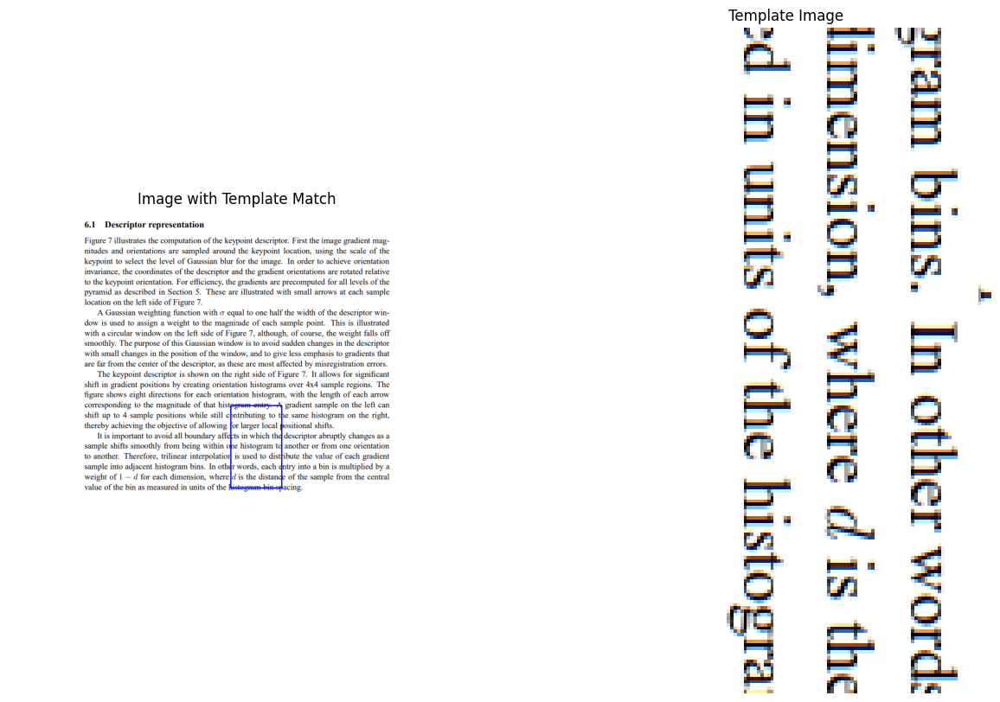

In [108]:
original_image = cv2.imread('Q3/3.0.png')  
hog_template_matching(original_image, cropped_image2, threshold=0.6)

Best match found at location: (328, 344) with score: 414.5816650390625


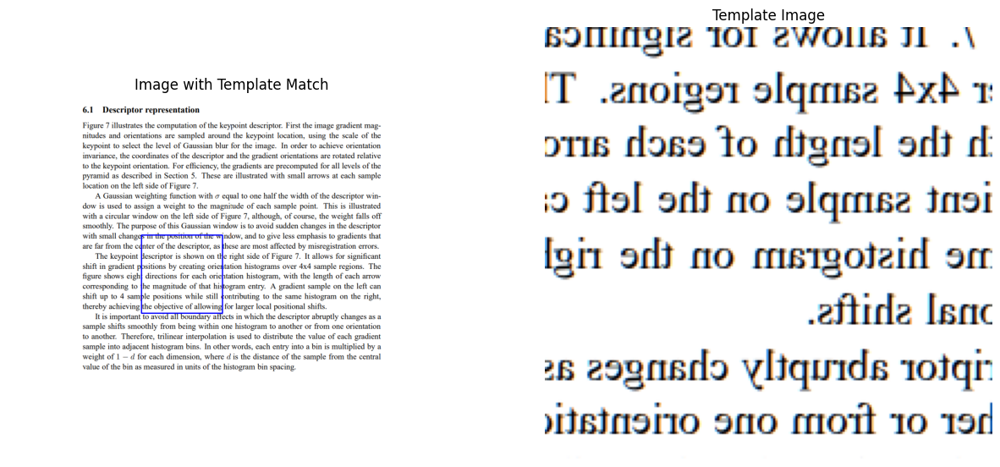

In [109]:
original_image = cv2.imread('Q3/3.0.png')  
hog_template_matching(original_image, cropped_image3, threshold=0.6)

Best match found at location: (280, 112) with score: 1297.464599609375


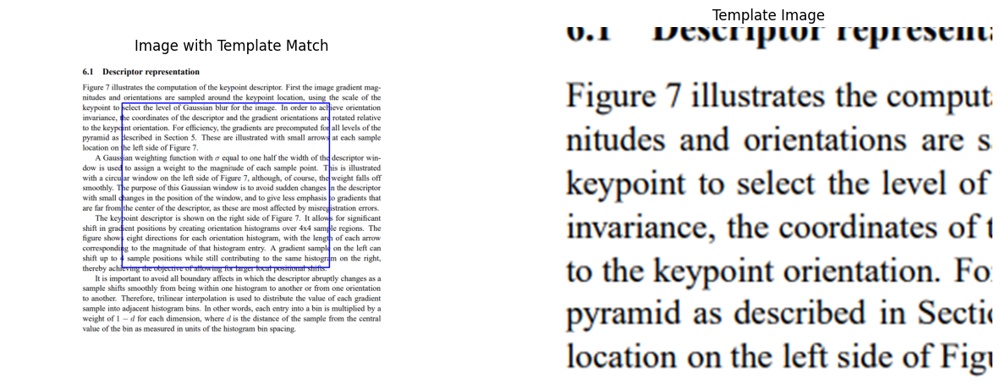

In [115]:
original_image = cv2.imread('Q3/3.0.png')  
hog_template_matching(original_image, cropped_image4, threshold=0.4)

Best match found at location: (120, 152) with score: 614.2516479492188


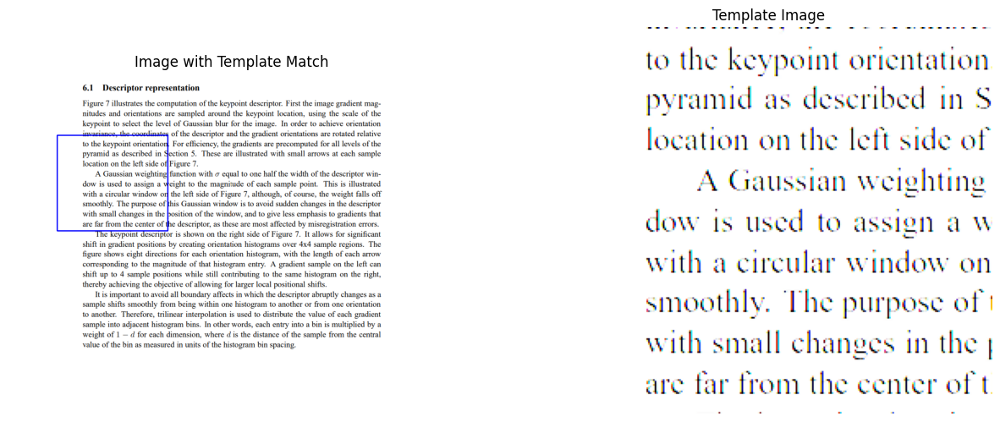

In [111]:
original_image = cv2.imread('Q3/3.0.png')  
hog_template_matching(original_image, cropped_image5, threshold=0.6)

Best match found at location: (344, 320) with score: 594.7225341796875


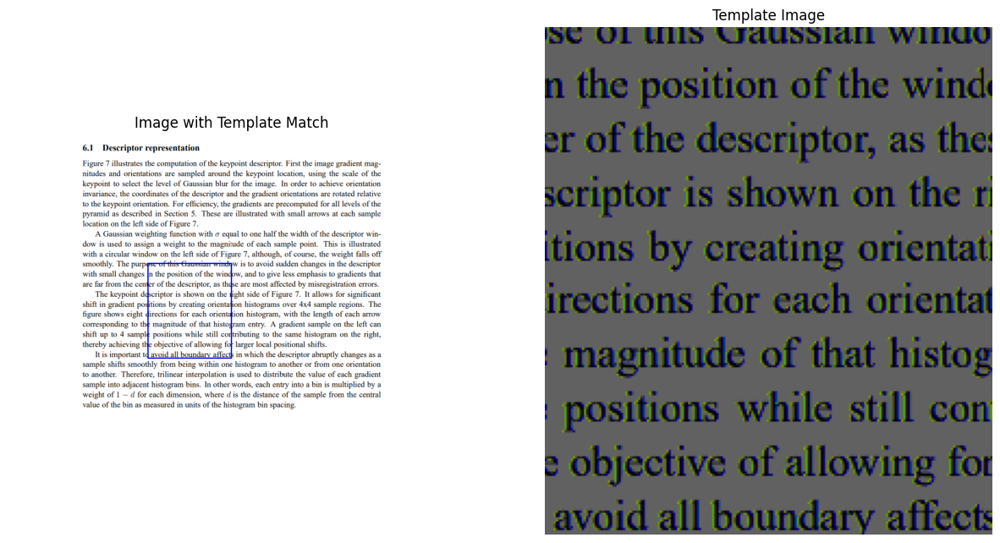

In [112]:
original_image = cv2.imread('Q3/3.0.png')  
hog_template_matching(original_image, cropped_image6, threshold=0.6)

Best match found at location: (144, 8) with score: 600.218505859375


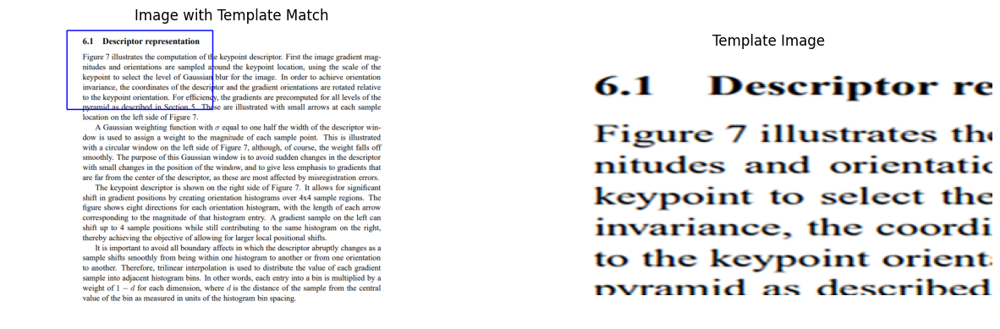

In [113]:
original_image = cv2.imread('Q3/3.0.png')  
hog_template_matching(original_image, cropped_image7, threshold=0.6)

Best match found at location: (392, 368) with score: 543.0673828125


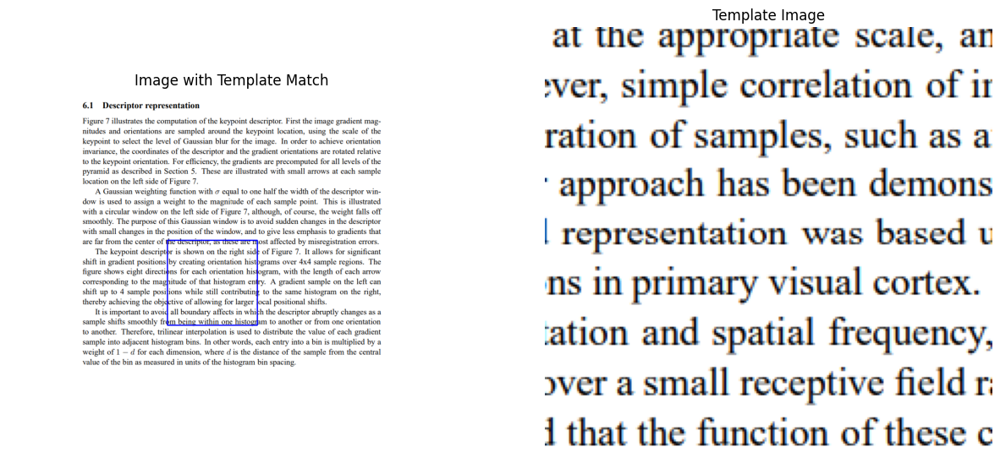

In [114]:
original_image = cv2.imread('Q3/3.0.png')  
hog_template_matching(original_image, cropped_image8, threshold=0.6)

Advantages of SIFT:
SIFT has higher accuracy and a ability to detect distinctive features within an image. It accurately identifys keypoints in images. SIFT is also robust to changes in scale,rotation and translation invariance meaning it can detect keypoints across different scales without being significantly affected by variations in image size. Because it exhibits strong resistance to changes in image orientation and translation. 


Advantages of HOG:
HOG is computationally simpler compared to SIFT, making it more efficient for certain applications where computational resources are limited. So it will be faster in feature extraction and matching tasks compared to SIFT, especially when real-time processing is happening. HOG is also good for object detection tasks such as human detection in images that the spatial distribution of gradient orientations provides discriminative information about the object's shape and structure.


Resilience to Changes:
Both SIFT and HOG are resilient to various changes in the image but SIFT is highly resilient to changes in scale, rotation, and translation. It can reliably detect keypoints even in the presence of such transformations. HOG, while also robust to changes in scale, is more suited for tasks like object detection and pedestrian detection where the spatial arrangement of gradient orientations is informative for discriminating objects of interest. However, it may not be as effective for tasks requiring precise keypoint localization under extreme transformations.